# Artistic Neural Style Transfer using PyTorch




In this kernel, we’ll implement the style transfer method that is outlined in the paper, [Image Style Transfer Using Convolutional Neural Networks, by Gatys](https://www.cv-foundation.org/openaccess/content_cvpr_2016/papers/Gatys_Image_Style_Transfer_CVPR_2016_paper.pdf) in PyTorch.

In this paper, style transfer uses the features found in the 19-layer VGG Network, which is comprised of a series of convolutional and pooling layers, and a few fully-connected layers. In the image below, the convolutional layers are named by stack and their order in the stack. Conv_1_1 is the first convolutional layer that an image is passed through, in the first stack. Conv_2_1 is the first convolutional layer in the *second* stack. The deepest convolutional layer in the network is conv_5_4.

<img src="https://github.com/udacity/deep-learning-v2-pytorch/raw/master/style-transfer/notebook_ims/vgg19_convlayers.png" width=80% />

An example is shown below, where the content image is of a cat, and the style image is of [Hokusai's Great Wave](https://en.wikipedia.org/wiki/The_Great_Wave_off_Kanagawa). The generated target image still contains the cat but is stylized with the waves, blue and beige colors, and block print textures of the style image!

<img src='https://github.com/udacity/deep-learning-v2-pytorch/raw/master/style-transfer/notebook_ims/style_tx_cat.png' width=80% />

In this implementation, we’ll expand on the method described in *Image Style Transfer Using Convolutional Neural Networks* by Gatys et al., not only by using a single style image but by combining multiple style images. This approach allows us to blend several unique artistic styles into the final output, resulting in a more complex and customized aesthetic.

### Separating Style and Content

Style transfer relies on separating the content and style of an image. Given one content image and multiple style images, we aim to create a new target image that contains our desired content while incorporating multiple styles:
* **Content**: The arrangement and objects in the **content image** are preserved in the target image.
* **Style**: The textures, colors, and patterns from each **style image** are blended together in the target image.

In the original paper, style transfer is achieved by computing a "style loss" based on the Gram matrices of the feature maps of a single style image in a pre-trained 19-layer VGG network. Here, we'll go a step further by calculating and blending style losses for multiple style images. This is done by applying separate Gram matrices for each style image, combining their influence through weighted blending, and looping through multiple styles to achieve a balanced mix.

### Multi-Style Transfer

Using multiple style images means we’ll blend style features extracted from various layers of the VGG network, weighted according to their influence on the target image. This method can create intricate compositions by capturing and combining artistic elements from different styles.

The process involves:
1. **Extracting Content and Style Features**: We’ll extract the content features from a specific layer in VGG (such as `conv4_2`) and style features from multiple layers (`conv1_1`, `conv2_1`, `conv3_1`, `conv4_1`, and `conv5_1`), computing Gram matrices for each style image.
2. **Combining Style Weights**: By assigning different blending weights to each style, we control how much each style contributes to the final output. This allows for fine-tuning the style blend.
3. **Iterating for Style Fusion**: Using optimization, we iteratively update the target image by minimizing the content and combined style loss.

This approach allows for creative control over the target image by fusing several styles, offering unique artistic results not possible with a single style image. Below, we illustrate this method with an example where a target image combines textures from multiple paintings, leading to a stylized effect that merges multiple artistic elements.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# import resources
%matplotlib inline

from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.optim as optim
from torchvision import transforms, models

In [ ]:
# get the "features" portion of VGG19 (we will not need the "classifier" portion)
vgg = models.vgg19(pretrained=True).features

# freeze all VGG parameters since we're only optimizing the target image
for param in vgg.parameters():
    param.requires_grad_(False)

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth
100%|██████████| 548M/548M [00:03<00:00, 168MB/s]


In [ ]:
# move the model to GPU, if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

vgg.to(device)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

In [ ]:
def load_image(img_path, max_size=400, shape=None):
    ''' Load in and transform an image, making sure the image
       is <= 400 pixels in the x-y dims.'''

    image = Image.open(img_path).convert('RGB')

    # large images will slow down processing
    if max(image.size) > max_size:
        size = max_size
    else:
        size = max(image.size)

    if shape is not None:
        size = shape

    in_transform = transforms.Compose([
                        transforms.Resize(size),
                        transforms.ToTensor(),
                        transforms.Normalize((0.485, 0.456, 0.406),
                                             (0.229, 0.224, 0.225))])

    # discard the transparent, alpha channel (that's the :3) and add the batch dimension
    image = in_transform(image)[:3,:,:].unsqueeze(0)

    return image

In [ ]:
import torch
import numpy as np

# Function to convert tensor to image
def im_convert(tensor):
    """Display a tensor as an image."""
    image = tensor.clone().detach().cpu().numpy()  # Clone and detach tensor, then move to CPU
    image = image.squeeze(0)  # Remove batch dimension
    image = image.transpose(1, 2, 0)  # Convert (C, H, W) to (H, W, C)
    image = np.clip(image, 0, 1)  # Clamp pixel values between 0 and 1
    return image


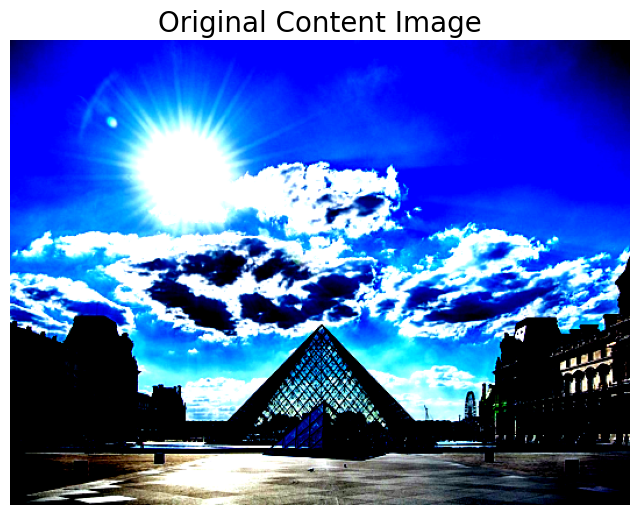

In [ ]:
content_path = "/content/drive/MyDrive/Neural Style Transfer/louvre.jpg"  # Path to the content image
content = load_image(content_path).to(device)

# Display the original content image
plt.figure(figsize=(8, 8))
plt.imshow(im_convert(content))
plt.title("Original Content Image", fontsize=20)
plt.axis("off")  # Hide axes for a cleaner look
plt.show()

In [ ]:
style_images = [
    "/content/drive/MyDrive/Neural Style Transfer/monet.jpg",
    "/content/drive/MyDrive/Neural Style Transfer/sandstone.jpg",
    "/content/drive/MyDrive/Neural Style Transfer/stone_style.jpg",
    # Add more style images as needed
]

# Initialize the target image with the content image
target = content.clone().requires_grad_(True).to(device)



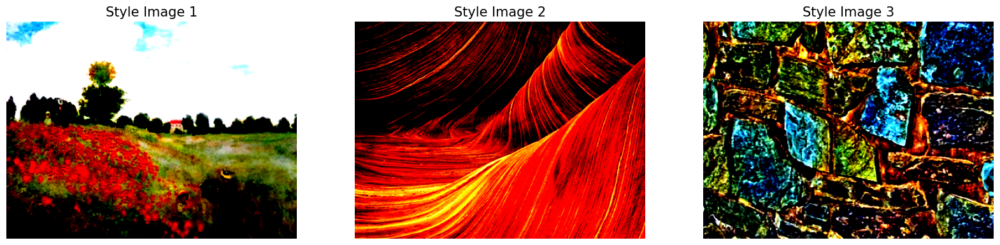

In [ ]:
import matplotlib.pyplot as plt

# Function to load and convert an image to displayable format
def load_and_convert_image(image_path):
    image = load_image(image_path).to("cpu")  # Assuming load_image loads and preprocesses the image
    return im_convert(image)  # Assuming im_convert handles the transformation to displayable format

# Display the style images
fig, axes = plt.subplots(1, len(style_images), figsize=(20, 10))
for i, style_img_path in enumerate(style_images):
    style_img = load_and_convert_image(style_img_path)
    axes[i].imshow(style_img)
    axes[i].set_title(f"Style Image {i+1}", fontsize=15)
    axes[i].axis("off")  # Turn off axes for a cleaner look
plt.show()

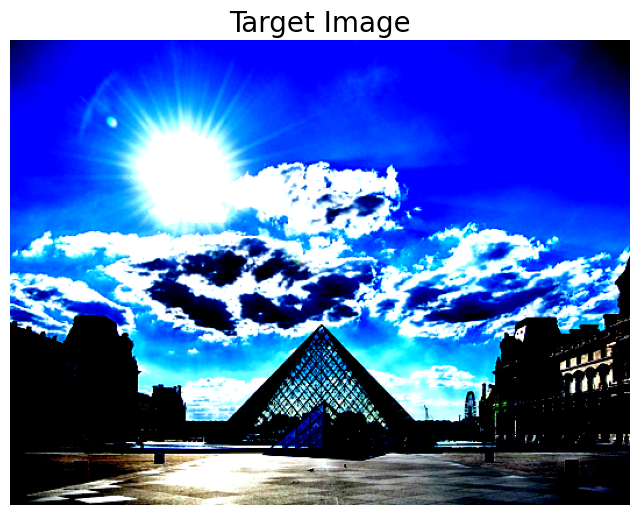

In [ ]:
plt.figure(figsize=(8, 8))
plt.imshow(im_convert(target))
plt.title("Target Image", fontsize=20)
plt.axis("off")  # Hide axes for a cleaner look
plt.show()

In [ ]:
# helper function for un-normalizing an image
# and converting it from a Tensor image to a NumPy image for display
def im_convert(tensor):
    """ Display a tensor as an image. """

    image = tensor.to("cpu").clone().detach()
    image = image.numpy().squeeze()
    image = image.transpose(1,2,0)
    image = image * np.array((0.229, 0.224, 0.225)) + np.array((0.485, 0.456, 0.406))
    image = image.clip(0, 1)

    return image

In [ ]:
# print out VGG19 structure so you can see the names of various layers
print(vgg)

Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (17): ReLU(inplace=True)
  (18): MaxPoo

## Content and Style Features

Below, complete the mapping of layer names to the names found in the paper for the _content representation_ and the _style representation_.

In [ ]:
def get_features(image, model, layers=None):
    """ Run an image forward through a model and get the features for
        a set of layers. Default layers are for VGGNet matching Gatys et al (2016)
    """

    ## TODO: Complete mapping layer names of PyTorch's VGGNet to names from the paper
    ## Need the layers for the content and style representations of an image
    if layers is None:
        layers = {'0': 'conv1_1',
                  '5': 'conv2_1',
                  '10': 'conv3_1',
                  '19': 'conv4_1',
                  '21': 'conv4_2',  ## content representation
                  '28': 'conv5_1'}

    features = {}
    x = image
    # model._modules is a dictionary holding each module in the model
    for name, layer in model._modules.items():
        x = layer(x)
        if name in layers:
            features[layers[name]] = x

    return features

---
## Gram Matrix

The output of every convolutional layer is a Tensor with dimensions associated with the `batch_size`, a depth, `d` and some height and width (`h`, `w`). The Gram matrix of a convolutional layer can be calculated as follows:
* Get the depth, height, and width of a tensor using `batch_size, d, h, w = tensor.size`
* Reshape that tensor so that the spatial dimensions are flattened
* Calculate the gram matrix by multiplying the reshaped tensor by it's transpose

*Note: You can multiply two matrices using `torch.mm(matrix1, matrix2)`.*

In [ ]:
def gram_matrix(tensor):
    """ Calculate the Gram Matrix of a given tensor
        Gram Matrix: https://en.wikipedia.org/wiki/Gramian_matrix
    """

    # get the batch_size, depth, height, and width of the Tensor
    _, d, h, w = tensor.size()

    # reshape so we're multiplying the features for each channel
    tensor = tensor.view(d, h * w)

    # calculate the gram matrix
    gram = torch.mm(tensor, tensor.t())

    return gram

In [ ]:
style_images = [
    "/content/drive/MyDrive/Neural Style Transfer/monet.jpg",
    "/content/drive/MyDrive/Neural Style Transfer/sandstone.jpg",
    "/content/drive/MyDrive/Neural Style Transfer/stone_style.jpg",
    # Add more style images as needed
]

# Dictionary to store style features for each style image
style_features_all = {}
style_grams_all = {}

# Load and process each style image
for style_path in style_images:
    # Load the style image
    style = load_image(style_path).to(device)

    # Extract style features using the VGG model
    style_features = get_features(style, vgg)
    style_features_all[style_path] = style_features

    # Calculate Gram matrices for the style features
    style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}
    style_grams_all[style_path] = style_grams

# Initialize the target image with the content image
target = content.clone().requires_grad_(True).to(device)


In [ ]:
# Set the style and content weights (same as before)
content_weight = 1  # alpha
style_weight = 1e9  # beta

# weights for each style layer (same as before)
style_weights = {'conv1_1': 1.,
                 'conv2_1': 0.75,
                 'conv3_1': 0.2,
                 'conv4_1': 0.2,
                 'conv5_1': 0.2}


Style Loss after 400 iterations: 15297875968.0


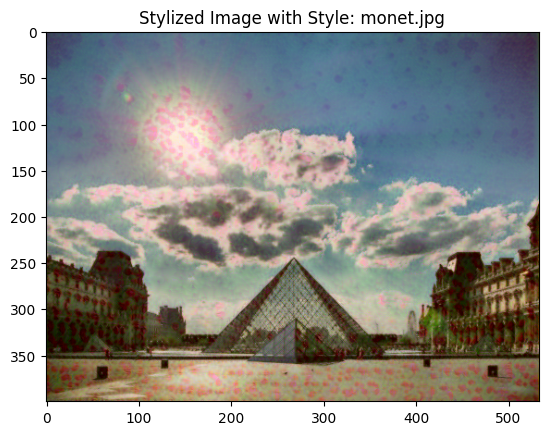

Style Loss after 800 iterations: 4997283840.0


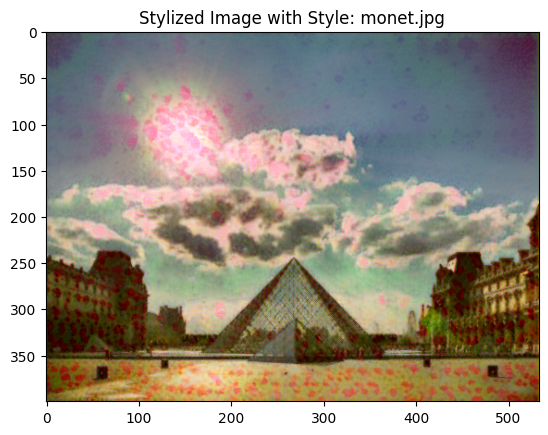

Style Loss after 1200 iterations: 2885498112.0


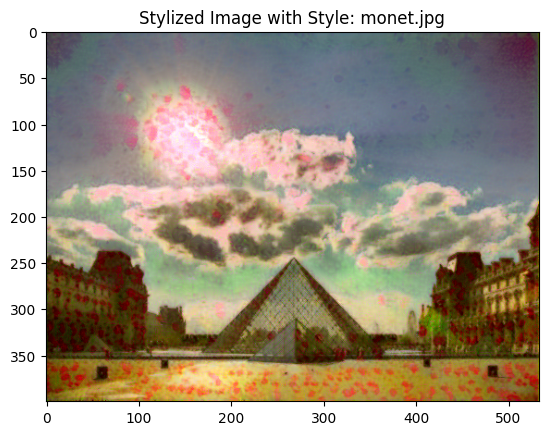

Style Loss after 1600 iterations: 2180560896.0


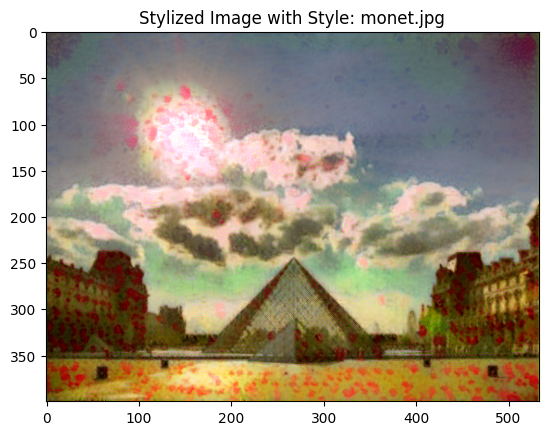

Style Loss after 2000 iterations: 1711330944.0


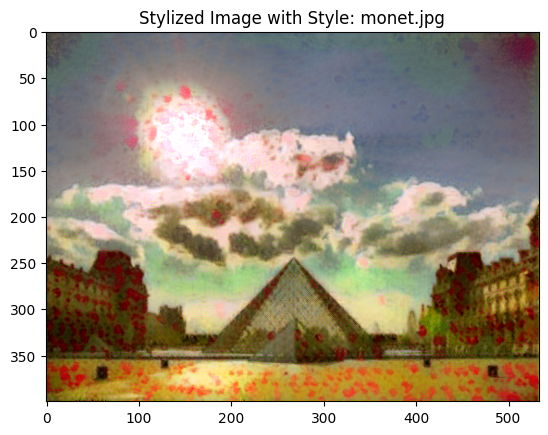

Style Loss after 400 iterations: 26761265152.0


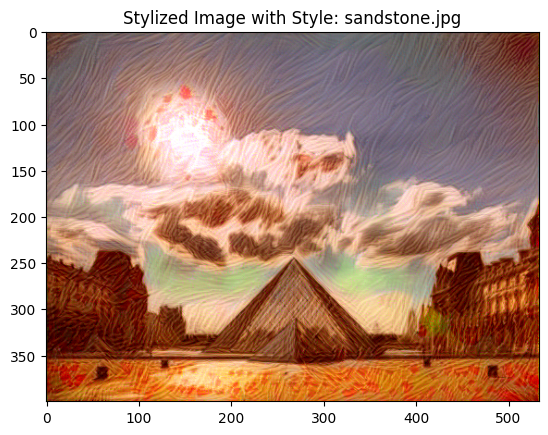

Style Loss after 800 iterations: 8623500288.0


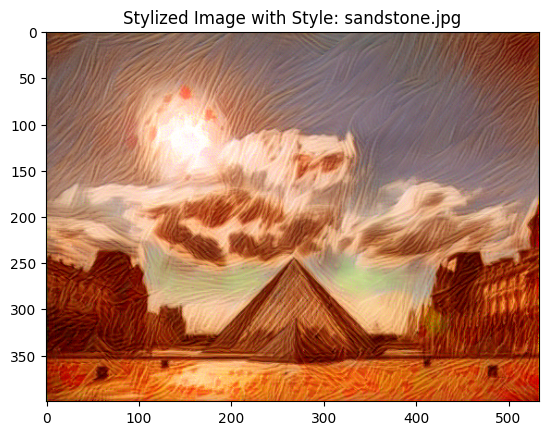

Style Loss after 1200 iterations: 4536262656.0


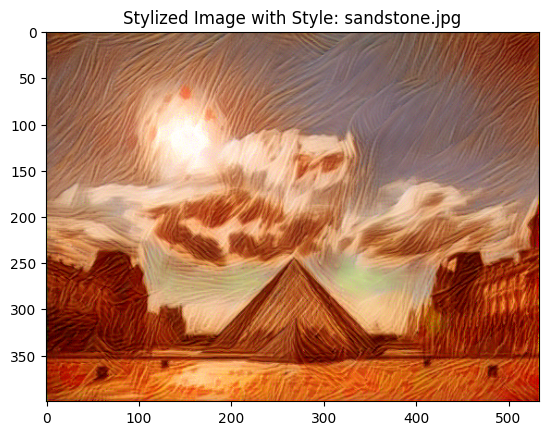

Style Loss after 1600 iterations: 2663005952.0


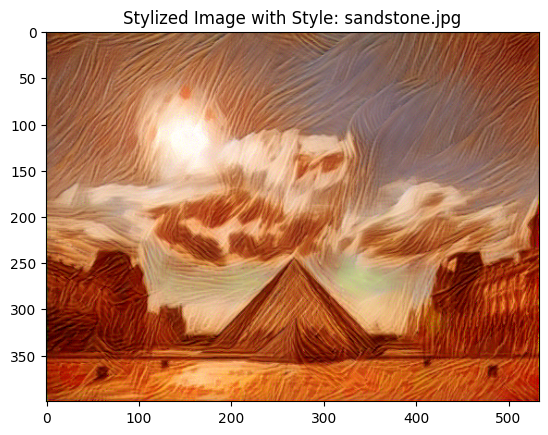

Style Loss after 2000 iterations: 1630856064.0


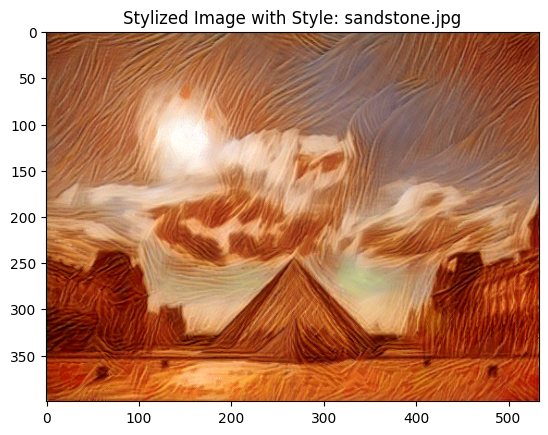

Style Loss after 400 iterations: 20969936896.0


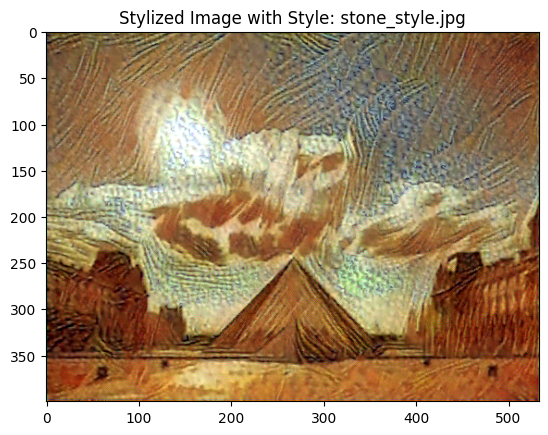

Style Loss after 800 iterations: 3827311360.0


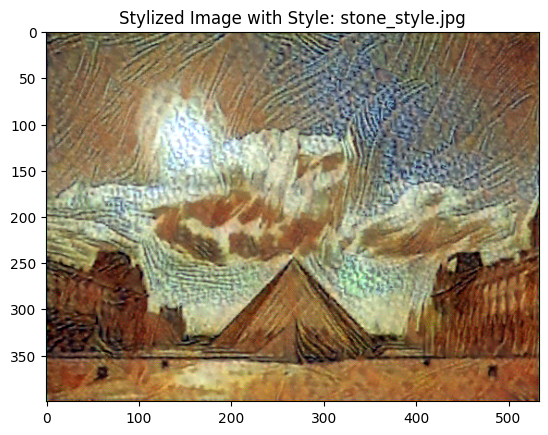

Style Loss after 1200 iterations: 1478402432.0


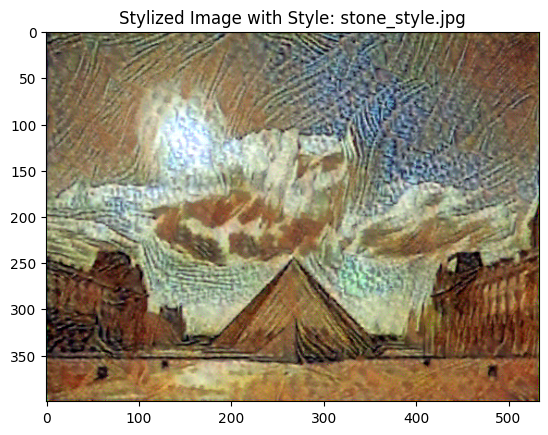

Style Loss after 1600 iterations: 834299584.0


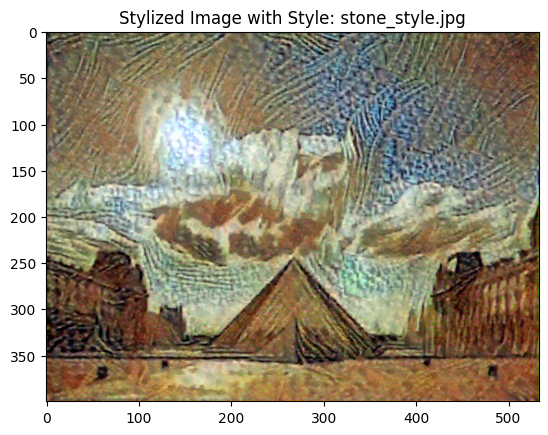

In [ ]:
steps = 2000
show_every = 400  # how often to display intermediate results

# Iterate over the style images
for style_img_path in style_images:
    # Load the style image for the current loop, resized to match content image size
    style = load_image(style_img_path, shape=content.shape[-2:]).to(device)

    # Get the features for the style image
    style_features = get_features(style, vgg)

    # Calculate the Gram matrices for the style image
    style_grams = {layer: gram_matrix(style_features[layer]) for layer in style_features}

    # Initialize the optimizer for the target image (using Adam)
    optimizer = optim.Adam([target], lr=0.003)

    # Now, perform the style transfer using the current style image
    for ii in range(1, steps + 1):
        # Get the features from the current target image
        target_features = get_features(target, vgg)

        # Calculate content loss
        content_loss = torch.mean((target_features['conv4_2'] - content_features['conv4_2'])**2)

        # Calculate style loss
        style_loss = 0
        for layer in style_weights:
            target_feature = target_features[layer]
            target_gram = gram_matrix(target_feature)
            _, d, h, w = target_feature.shape
            style_gram = style_grams[layer]
            layer_style_loss = style_weights[layer] * torch.mean((target_gram - style_gram)**2)
            style_loss += layer_style_loss / (d * h * w)

        # Total loss: content + style
        total_loss = content_weight * content_loss + style_weight * style_loss

        # Update the target image based on the total loss
        optimizer.zero_grad()
        total_loss.backward()
        optimizer.step()

        # Display the intermediate result
        if ii % show_every == 0:
            print(f"Style Loss after {ii} iterations: {total_loss.item()}")
            plt.imshow(im_convert(target))
            plt.title(f"Stylized Image with Style: {style_img_path.split('/')[-1]}")
            plt.show()

    # The target image from this loop will become the content image for the next iteration
    content = target.clone().detach()

## Display the Target Image

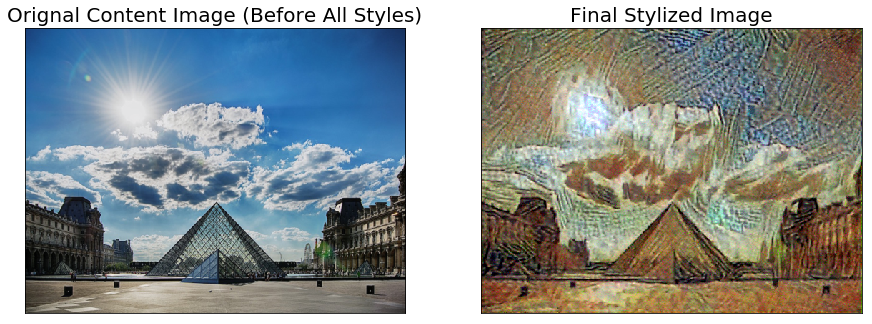

In [ ]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 10))
content_path = "/kaggle/input/image-new/louvre.jpg"  # Path to the content image
content = load_image(content_path).to(device)
ax1.imshow(im_convert(content))
ax1.set_title("Orignal Content Image (Before All Styles)", fontsize=20)
ax2.imshow(im_convert(target))
ax2.set_title("Final Stylized Image", fontsize=20)
ax1.grid(False)
ax2.grid(False)
ax1.set_xticks([])
ax1.set_yticks([])
ax2.set_xticks([])
ax2.set_yticks([])
plt.show()